# Kalpit Borkar 200070029

# Importing libraries

In [2]:
# Importing libraries
import numpy as np
import cv2
import matplotlib.pyplot as plt
from matplotlib import rcParams
from google.colab.patches import cv2_imshow
from scipy import signal, misc
import math
import pywt
import pywt.data

# 1. Write the following basic functions using numpy and scipy signal libraries only in an efficient manner:

## a. Add additive white Gaussian noise (AWGN) with variable variance to any given image, whether gray scale or color. The noise should be independent in RGB channels for color images. [1]

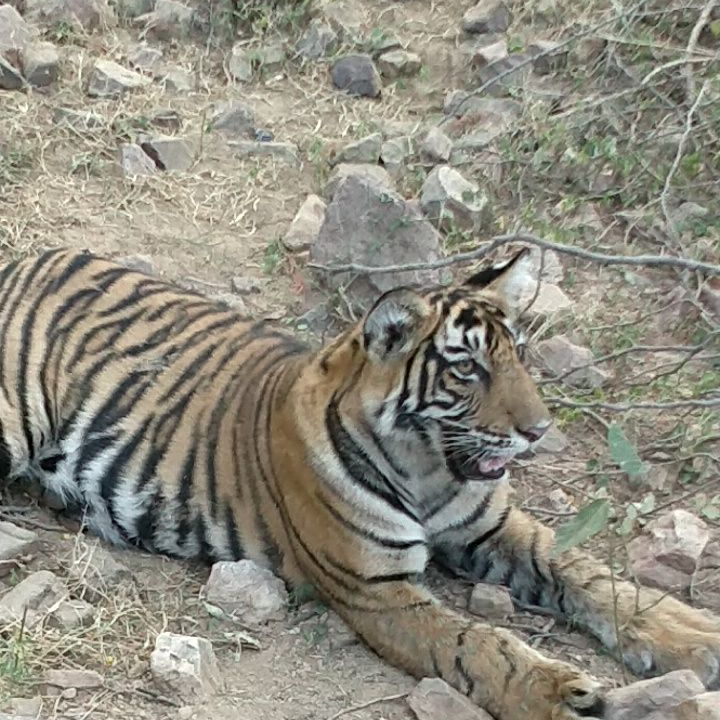

In [3]:
img1 = cv2.imread('q1.jpg') # Read the image
img1 = img1[200:920, 0:720] # Crop the image into 720x720 res
cv2_imshow(img1) # Display the image

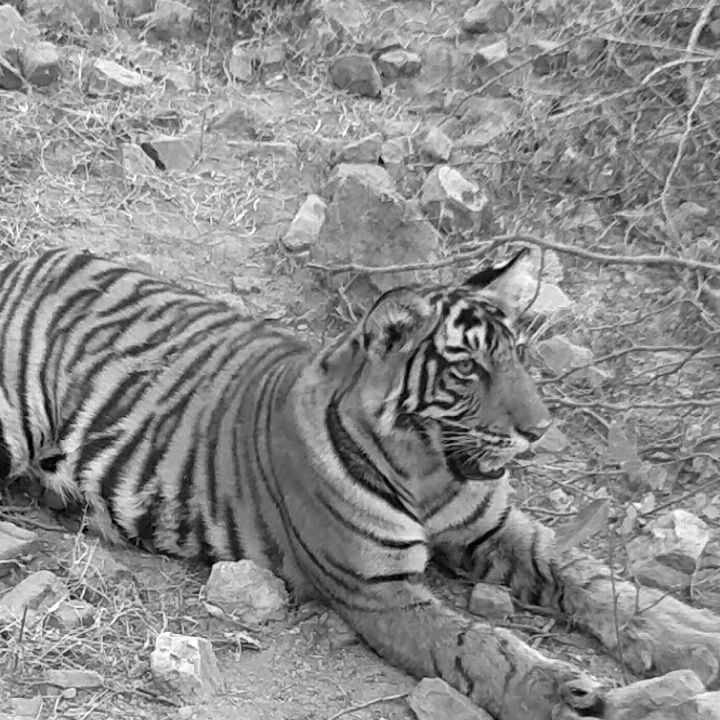

In [4]:
img1_gray = cv2.imread('q1.jpg', 0) # Read the image
img1_gray = img1_gray[200:920, 0:720] # Crop the image into 720x720 res
cv2_imshow(img1_gray) # Display the image

In [5]:
# Function to add Additive White Gaussian Noise AWGN
def add_AWGN(mean, var, img):
  if(img.ndim == 2): # If the image is grayscale
    sigma = var**0.5 # Set sigma
    white_gaussian_noise = np.random.normal(mean, sigma, img.shape) # Generate white gaussian noise
    res = img + white_gaussian_noise # Add to image
    return res
  elif(img.ndim == 3): # If the image is colored (RGB)
    sigma = var**0.5 # Set sigma
    # Generate white gaussian noise for RGB channels independently
    white_gaussian_noise1 = np.random.normal(mean, sigma, img.shape[:2])
    white_gaussian_noise2 = np.random.normal(mean, sigma, img.shape[:2])
    white_gaussian_noise3 = np.random.normal(mean, sigma, img.shape[:2])
    b, g, r = cv2.split(img) # Split the image into RGB channels
    # Add noise to the channels
    res_b = b + white_gaussian_noise1
    res_g = g + white_gaussian_noise2
    res_r = r + white_gaussian_noise3
    res = cv2.merge([res_b, res_g, res_r]) # Merge the channels
    return res
  else: # If the image is neither grayscale nor RGB colored
    print("Image not compatible")
    return None

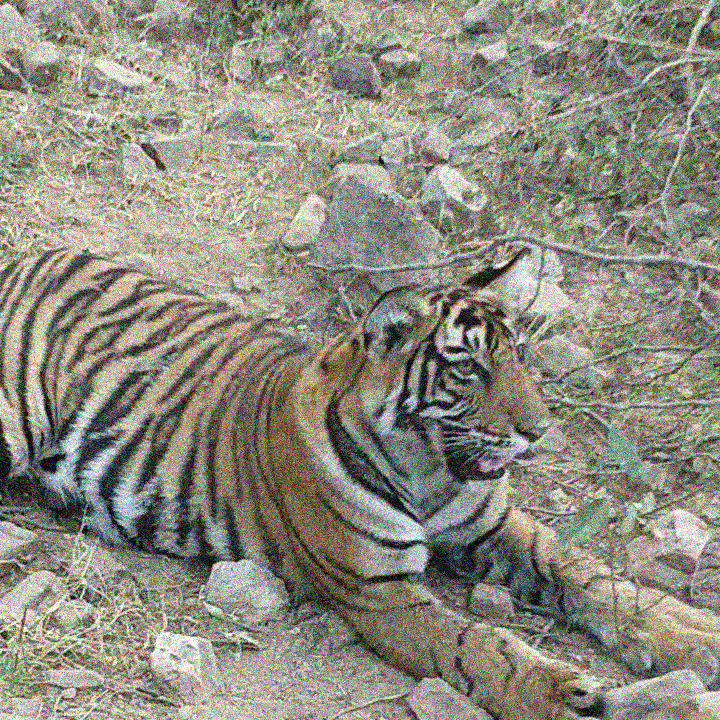

In [6]:
# Check AWGN function with colored image
img1_with_noise = add_AWGN(0, 1000, img1)
cv2_imshow(img1_with_noise)

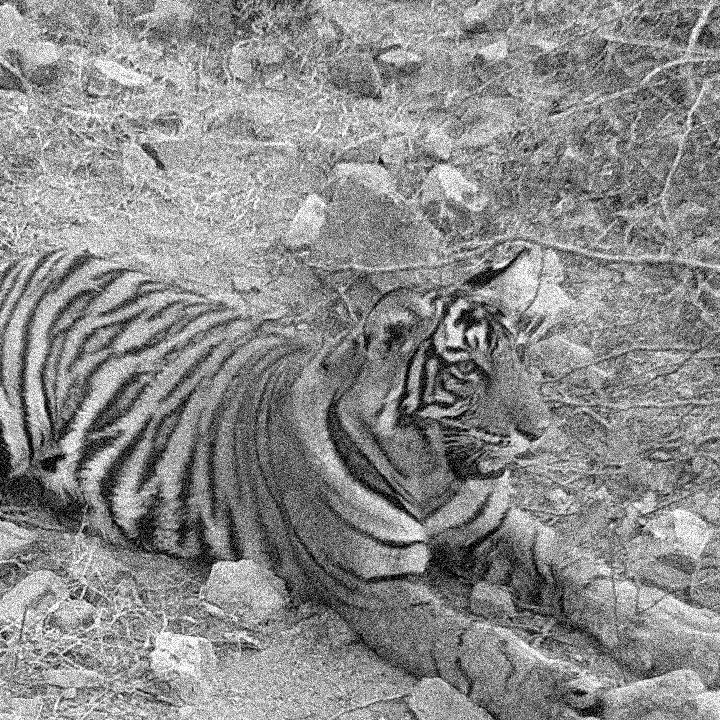

In [7]:
# Check AWGN function with grayscale image
img1_gray_with_noise = add_AWGN(0, 1000, img1_gray)
cv2_imshow(img1_gray_with_noise)

In [8]:
# Define a utility function to compare images side by side
def show_side_by_side(img1, img2, var = None):
  rcParams['figure.figsize'] = 11 ,8
  fig, ax = plt.subplots(1,2) # Define figure and axes
  if(var != None):
    fig.suptitle(f'Var is: {var}', fontsize = 16)
  ax[0].imshow(img1, cmap = 'gray') # plot img1
  ax[1].imshow(img2, cmap = 'gray') # plot img2
  

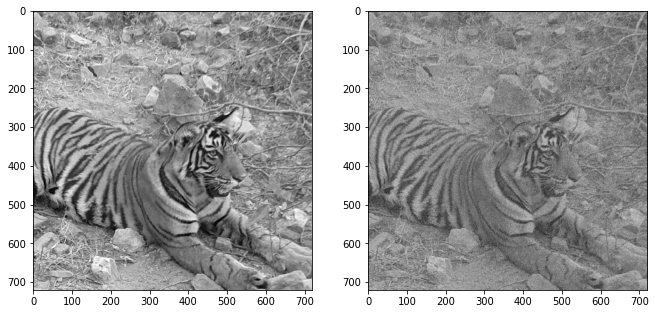

In [9]:
# Compare img and img with added AWGN side by side
show_side_by_side(img1_gray, img1_gray_with_noise)

## b. Measure PSNR (with 255 as the default peak, but it should also be variable) between a restored image and a ground-truth image. Do not import a PSNR function directly, even if available. [1]

In [10]:
# Define a function to compute PSNR
def psnr(original_img, restored_img, L = 256):
  rmse = math.sqrt(np.mean((original_img - restored_img)**2)) # Calculate RMSE
  res = 20*math.log((L-1)/rmse) # Compute PSNR
  return res

In [11]:
# Check PSNR function with some example color and grayscale images
psnr_gray = psnr(img1_gray, img1_gray_with_noise)
psnr_color = psnr(img1, img1_with_noise)
print("PSNR for color image:", psnr_gray)
print("PSNR for grayscale image:", psnr_color)

PSNR for color image: 41.73334391921858
PSNR for grayscale image: 41.73278608766995


## c. Measure SSIM (with power 1 for all three elements -- mean, variance, correlation -- which can bevaried too) between a restored and a ground-truth image. Do not import an SSIM function directly, even if available. [1]

In [90]:
# Define a helper function to compute SSIM score
def SSIM_score_helper(img1, img2, L = 255, k1 = 1, k2 = 1): # Helper function
  mu1, mu2 = np.mean(img1), np.mean(img2) # Compute mean of img1 and img2
  var1, var2 = np.mean((img1-mu1)**2), np.mean((img2-mu2)**2) # Compute variance of img1 and img2
  sigma12 = np.mean((img1-mu1)*(img2-mu2)) # Compute covariance of img1 and img2
  C1, C2 = (k1*L)**2, (k2*L)**2 # Compute C1 and C2
  # Note: Here k1 and k2 are normalizing factors, could be set to any values as needed
  ssim = ((2*mu1*mu2 + C1)*(sigma12 + C2))/((mu1**2 + mu2**2 + C1)*(var1 + var2 + C2)) # Compute SSIM
  return ssim

In [91]:
# https://dsp.stackexchange.com/questions/75187/how-to-apply-the-ssim-measure-on-rgb-images
# Function to compute SSIM Score
def SSIM_score(img1, img2, L = 255, k1 = 1, k2 = 1):
  if(img1.ndim == 2): # If the image is grayscale
    return SSIM_score_helper(img1, img2, L, k1, k2)
  elif(img1.ndim == 3): # If the image is RGB
    # Split img1 and img2 into RGB channels
    b1, g1, r1 = cv2.split(img1)
    b2, g2, r2 = cv2.split(img2)
    # Note: Here we compute SSIM score for RGB channels seperately and return their mean
    return (SSIM_score_helper(b1, b2, L, k1, k2) + SSIM_score_helper(g1, g2, L, k1, k2) + SSIM_score_helper(r1, r2, L, k1, k2))/3

In [92]:
# Check the SSIM_score function with an example RGB image
score = SSIM_score(img1, img1_with_noise)
print("The SSIM score is:", score)

The SSIM score is: 0.9586453380423837


## d. Isotropic Gaussian blurring (Gaussian low pass filtering) of an image for a given variance. [1]

In [93]:
# https://stackoverflow.com/questions/17190649/how-to-obtain-a-gaussian-filter-in-python
# Define a function to return a gaussian blur kernel
def gaussian_blur_kernel(kernel_size = 3, sigma = 1):
  m = n = (kernel_size-1.)/2.
  y,x = np.ogrid[-m:m+1,-n:n+1]
  h = np.exp( -(x**2+y**2) / (2.*(sigma**2)) )
  h[ h < np.finfo(h.dtype).eps*h.max() ] = 0
  h_sum = sum = h.sum()
  h /= h_sum
  return h

In [94]:
# Observe the gaussian kernel with some example parameters (kernel_size and variance)
kernel = gaussian_blur_kernel(5, 1)
print(kernel)

[[0.00296902 0.01330621 0.02193823 0.01330621 0.00296902]
 [0.01330621 0.0596343  0.09832033 0.0596343  0.01330621]
 [0.02193823 0.09832033 0.16210282 0.09832033 0.02193823]
 [0.01330621 0.0596343  0.09832033 0.0596343  0.01330621]
 [0.00296902 0.01330621 0.02193823 0.01330621 0.00296902]]


In [95]:
# Define a function to perform isotropic gaussian blurring on an image
def isotropic_gaussian_blurring(img, kernel_size = 3, sigma = 1):
  kernel = gaussian_blur_kernel(kernel_size, sigma) # Generate a gaussian kernel
  res = cv2.filter2D(img, -1, kernel) # Convolve the image with the generated kernel
  return res

# 2. Write the following denoising functions for wavelet transforms (you can use a library for DWT and IDWT):

## a. Hard thresholding: set to zero any detail (LH, HL, HH) coefficient that is below a threshold (threshold should be variable). [1]

In [96]:
# https://pywavelets.readthedocs.io/en/latest/
# https://pywavelets.readthedocs.io/en/latest/ref/idwt-inverse-discrete-wavelet-transform.html
# https://pywavelets.readthedocs.io/en/latest/ref/2d-dwt-and-idwt.html

# Define a function for hard thesholding the wavelet transforms of an image
def hard_threshold(img, threshold = None): # Here image should be grayscale/ one of the RGB channels
  coeffs = pywt.dwt2(img, 'haar') # Compute the wavelet transform
  LL, (LH, HL, HH) = coeffs # Extract them
  # Iterate over the coefficients and set them to zero if below a threshold
  for i in range(0, LH.shape[0]):
    for j in range(0, LH.shape[1]):
      if(LH[i][j] < threshold):
        LH[i][j] = 0 # If below threshold, set to zero.
      if(HL[i][j] < threshold):
        HL[i][j] = 0 # If below threshold, set to zero.
      if(HH[i][j] < threshold):
        HH[i][j] = 0 # If below threshold, set to zero.
  # plt.imshow(LH, interpolation="nearest", cmap=plt.cm.gray) #See the image
  coeffs = LL, (LH, HL, HH) # Compile them
  res = pywt.idwt2(coeffs, 'haar') # Compute inverse DWT
  return res

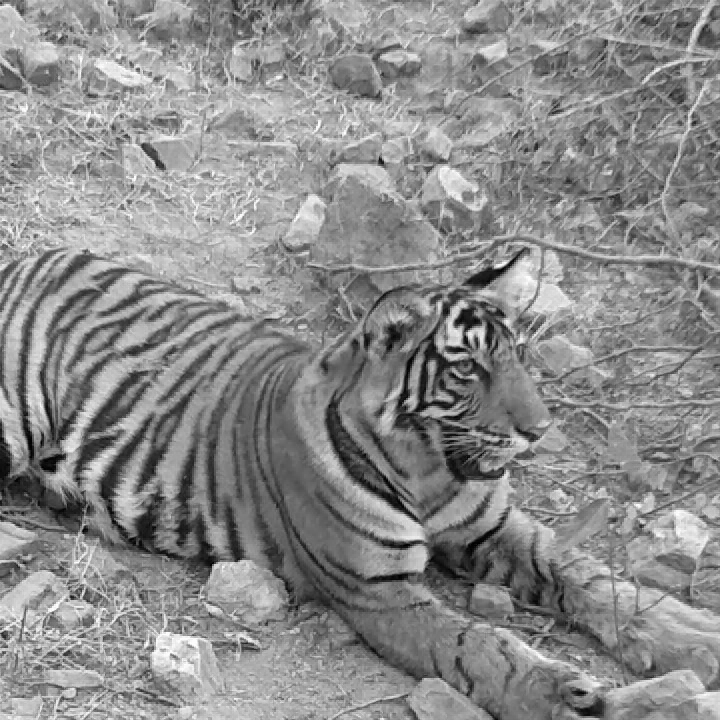

In [97]:
# Check the hard_threshold function on an example grayscale image
cv2_imshow(hard_threshold(img1_gray, 1))

## b. Soft threhsolding: set to zero any detail (LH, HL, HH) coefficient that is below a threshold (threshold should be variable), and subtract the threshold from those that are above the threshold. [1]

In [98]:
# Define a function for soft thresholding - same as above with some changes
def soft_threshold(img, threshold = None): # Here image should be grayscale/ one of the RGB channels
  coeffs = pywt.dwt2(img, 'haar')# Compute the wavelet transform
  LL, (LH, HL, HH) = coeffs # Extract them
  # Iterate over the coefficients and set them to zero if below a threshold
  for i in range(0, LH.shape[0]):
    for j in range(0, LH.shape[1]):
      if(LH[i][j] < threshold):
        LH[i][j] = 0 # If below threshold, set to 0.
      else: LH[i][j] -= threshold # If above threshold, subtract threshold from the value.
      if(HL[i][j] < threshold):
        HL[i][j] = 0 # If below threshold, set to 0.
      else: HL[i][j] -= threshold # If above threshold, subtract threshold from the value.
      if(HH[i][j] < threshold):
        HH[i][j] = 0 # If below threshold, set to 0.
      else: HH[i][j] -= threshold # If above threshold, subtract threshold from the value.
  # plt.imshow(LH, interpolation="nearest", cmap=plt.cm.gray) #See the image
  coeffs = LL, (LH, HL, HH) # Compile the coeffs
  res = pywt.idwt2(coeffs, 'haar') # Inverse DWT
  return res

## c. The method proposed in the paper “Image Denoising using Neighbouring Wavelet Coefficients” by Chen et al. [3]
- https://www.egr.msu.edu/~aviyente/neighshrink.pdf

In [99]:
# Define the function NeighShrink as given in the above paper
def NeighShrink(img, var, N = 3): # Here img is grayscale or one of RGB channels
  lambda_squared = 4*var*math.log(img.shape[0]) # Compute square of the threshold
  coeffs = pywt.dwt2(img, 'haar') # Compute the coeffs
  LL, (LH, HL, HH) = coeffs # Extract the coeffs
  res_LH, res_HL, res_HH = LH, HL, HH # Define the resultant coeffs
  LH_squared, HL_squared, HH_squared = LH**2, HL**2, HH**2 # Square them to compute d_i^2

  # Iterate through the coeffs
  for i in range(int((N-1)/2), LH.shape[0] - int((N-1)/2)):
    for j in range(int((N-1)/2), LH.shape[0] - int((N-1)/2)):
      # for LH
      sum = np.sum(LH_squared[i - int((N-1)/2) : i + int((N-1)/2)][j - int((N-1)/2): j + int((N-1)/2)]) # Compute the sum of squares of the coeffs in the given window B 
      beta = max(0, 1 - (lambda_squared/sum)) # Compute beta, set beta to 0 if negative
      res_LH[i][j] *= beta # Scale the coeffs with beta
      # for HL
      sum = np.sum(HL_squared[i - int((N-1)/2) : i + int((N-1)/2)][j - int((N-1)/2): j + int((N-1)/2)]) # Compute the sum of squares of the coeffs in the given window B 
      beta = max(0, 1 - (lambda_squared/sum)) # Compute beta, set beta to 0 if negative
      res_HL[i][j] *= beta # Scale the coeffs with beta
      # for HH
      sum = np.sum(HH_squared[i - int((N-1)/2) : i + int((N-1)/2)][j - int((N-1)/2): j + int((N-1)/2)]) # Compute the sum of squares of the coeffs in the given window B 
      beta = max(0, 1 - (lambda_squared/sum)) # Compute beta, set beta to 0 if negative
      res_HH[i][j] *= beta # Scale the coeffs with beta
      
    coeffs = LL, (res_LH, res_HL, res_HH) # Compile the coeffs
    res = pywt.idwt2(coeffs, 'haar') # Inverse DWT
    return res

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: divide by zero encountered in double_scalars
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: RuntimeWarning: divide by zero encountered in double_scalars
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: RuntimeWarning: divide by zero encountered in double_scalars


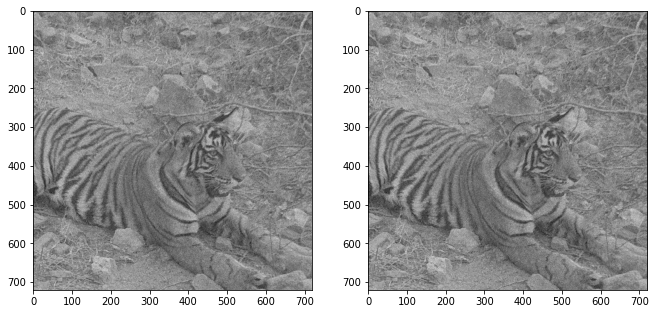

In [100]:
# Check the NeighShrink function with an example - could use one of RGB channels or grayscale
example_neight_shrink = NeighShrink(img1_gray_with_noise, 11)
show_side_by_side(img1_gray_with_noise, example_neight_shrink)

# 3. Compare PSNR and SSIM (with plots) when you vary the noise added to clean color images by varying:

## a. Noise variance [1]

In [101]:
psnr_arr = [] # Array to keep track of PSNR values
ssim_arr = [] # Array to keep track of SSIM values
var_arr = [] # Array to keep track of variance values
for var in range(1, 100000, 1000): # Vary variance
  psnr_arr.append(psnr(img1, add_AWGN(0, var, img1))) # Compute PSNR and add to array
  ssim_arr.append(SSIM_score(img1, add_AWGN(0, var, img1))) # Compute SSIM and add to array
  var_arr.append(var)

psnr_arr = np.array(psnr_arr)
ssim_arr = np.array(ssim_arr)
var_arr = np.array(var_arr)

Text(0, 0.5, 'PSNR')

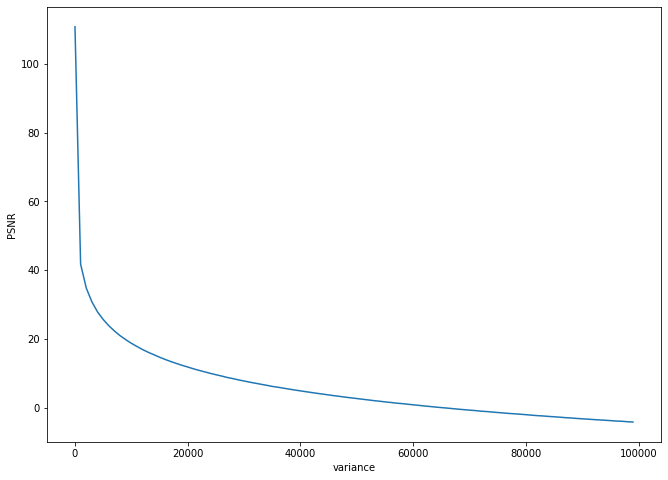

In [102]:
# Plot variance vs PSNR
plt.plot(var_arr, psnr_arr)
plt.xlabel('variance')
plt.ylabel('PSNR')

- As we increase variance, PSNR decreases rapidly first and then slows down.
- We expect this, because as noise increases the peak signal to noise ratio decreases rapidly. 
- Also observe that as variance becomes very large, PSNR becomes negative, ie the term (L-1)/RMSE becomes less than 1.

Text(0, 0.5, 'SSIM')

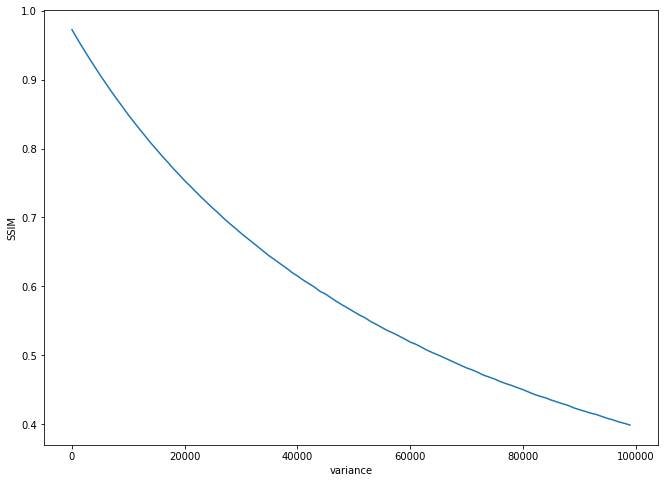

In [103]:
# Plot variance vs SSIM
plt.plot(var_arr, ssim_arr)
plt.xlabel('variance')
plt.ylabel('SSIM')

- SSIM measures the similarity between two images.
- As more noise is added, the similiarity between two images decreases and thus SSIM decreases as expected.
- We also expect the variance of the noisy image to increase, and thus SSIM decreases (since they are inversely proportional)



## b. Gaussian low pass filtering with various variances [1]

In [104]:
psnr_arr = [] # Array to keep track of PSNR values
ssim_arr = [] # Array to keep track of SSIM values
var_arr = [] # Array to keep track of variance values
for var in range(1, 200, 2):
  blurred_img = isotropic_gaussian_blurring(img1, 3, math.sqrt(var)) # Use gaussian blurring
  psnr_arr.append(psnr(img1, blurred_img)) # Compute PSNR
  ssim_arr.append(SSIM_score(img1, blurred_img)) # Compute SSIM
  var_arr.append(var)
  
  
psnr_arr = np.array(psnr_arr)
ssim_arr = np.array(ssim_arr)
var_arr = np.array(var_arr)

Text(0, 0.5, 'PSNR')

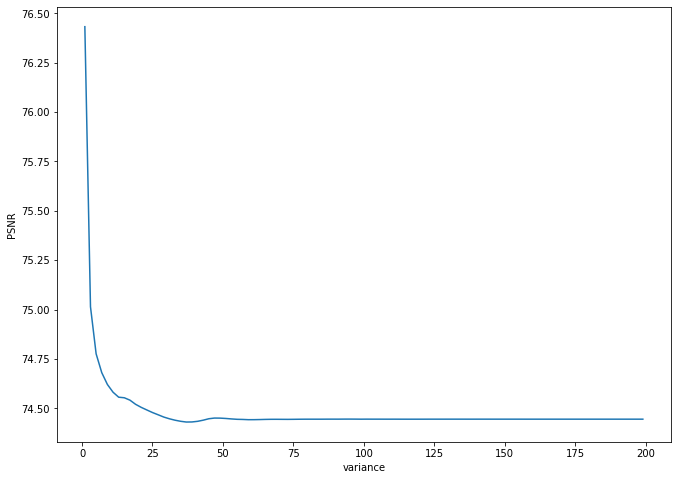

In [105]:
# Plot var vs PSNR
plt.plot(var_arr, psnr_arr)
plt.xlabel('variance')
plt.ylabel('PSNR')

- PSNR decreases rather rapidly with increase in variance and settles at a limit.

Text(0, 0.5, 'SSIM')

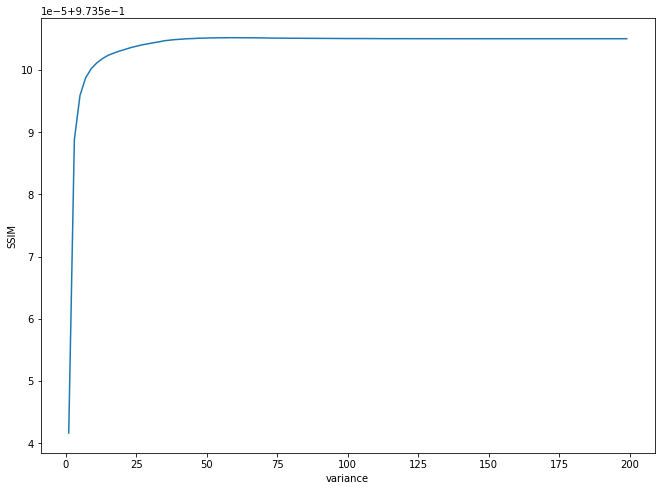

In [106]:
# Plot var vs SSIM
plt.plot(var_arr, ssim_arr)
plt.xlabel('variance')
plt.ylabel('SSIM')

- Similarly SSIM increases rather rapidly as we increase the variance of gaussian kernel

## c. The two thresholding methods, where threshold is given by λ = 𝜎 2 log 𝑛2 (as suggested by Donoho et al.), where 𝜎 is noise variance, and 𝑛 is window size. [2]

### Hard thresholding

In [107]:
# Define the arrays
psnr_arr = []
ssim_arr = []
var_arr = []

for var in range(1, 10000, 100):
  sigma = math.sqrt(var) # Compute sigma
  threshold = 2*sigma*math.sqrt(math.log(img1_gray.shape[0])) # Define threshold as given
  blurred_img = hard_threshold(img1_gray, threshold) # Apply hard threshold to image
  psnr_arr.append(psnr(img1_gray, blurred_img)) # Compute PSNR
  ssim_arr.append(SSIM_score(img1_gray, blurred_img)) # Compute SSIM
  var_arr.append(var)
  
  
psnr_arr = np.array(psnr_arr)
ssim_arr = np.array(ssim_arr)
var_arr = np.array(var_arr)

Text(0, 0.5, 'PSNR')

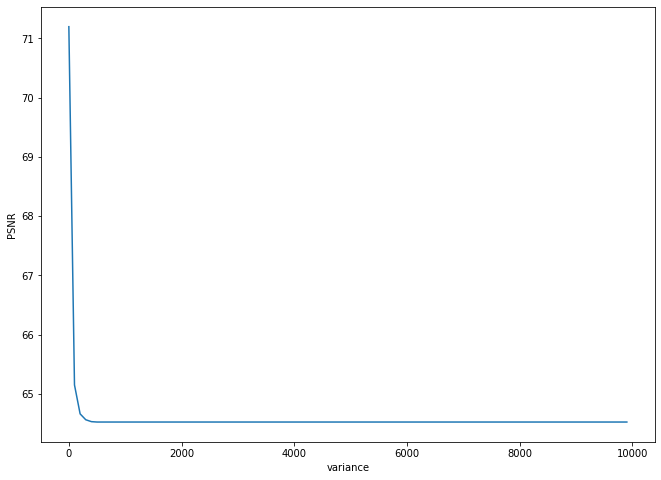

In [108]:
# Plot var vs PSNR
plt.plot(var_arr, psnr_arr)
plt.xlabel('variance')
plt.ylabel('PSNR')

Text(0, 0.5, 'SSIM')

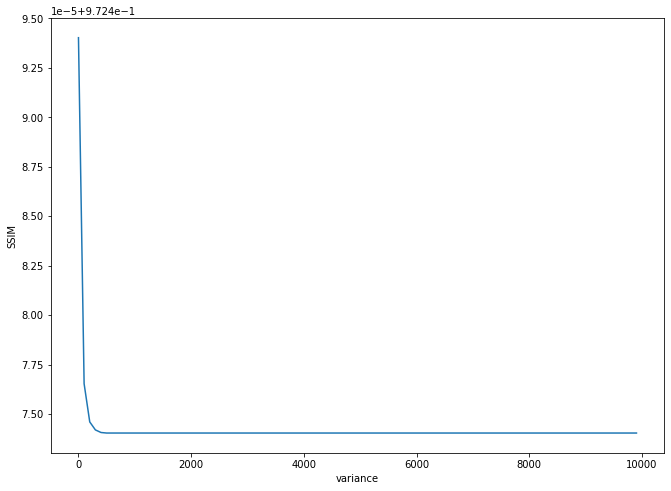

In [109]:
# Plot var vs SSIM
plt.plot(var_arr, ssim_arr)
plt.xlabel('variance')
plt.ylabel('SSIM')

- Here both PSNR and SSIM decrease with increase in variance and settle at a limit

### Soft thresholding

In [110]:
# Define the arrays
psnr_arr = []
ssim_arr = []
var_arr = []

for var in range(1, 10000, 100):
  sigma = math.sqrt(var) # Compute sigma
  threshold = 2*sigma*math.sqrt(math.log(img1_gray.shape[0])) # Define threshold as given
  blurred_img = soft_threshold(img1_gray, threshold) # Apply hard threshold to image
  psnr_arr.append(psnr(img1_gray, blurred_img)) # Compute PSNR
  ssim_arr.append(SSIM_score(img1_gray, blurred_img)) # Compute SSIM
  var_arr.append(var)
  
  
psnr_arr = np.array(psnr_arr)
ssim_arr = np.array(ssim_arr)
var_arr = np.array(var_arr)

Text(0, 0.5, 'PSNR')

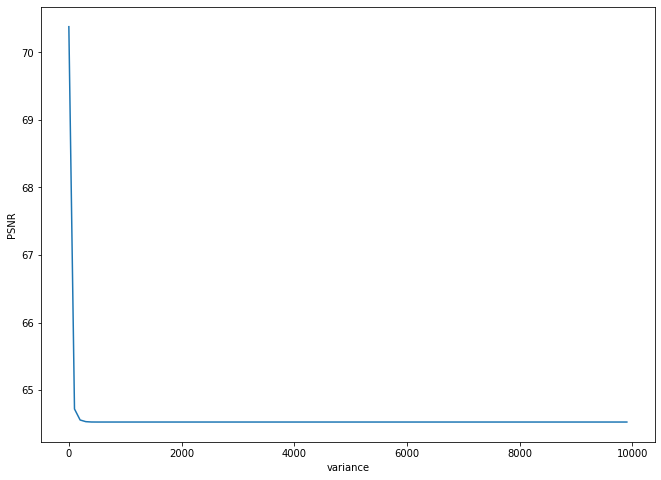

In [111]:
# Plot var vs PSNR
plt.plot(var_arr, psnr_arr)
plt.xlabel('variance')
plt.ylabel('PSNR')

Text(0, 0.5, 'SSIM')

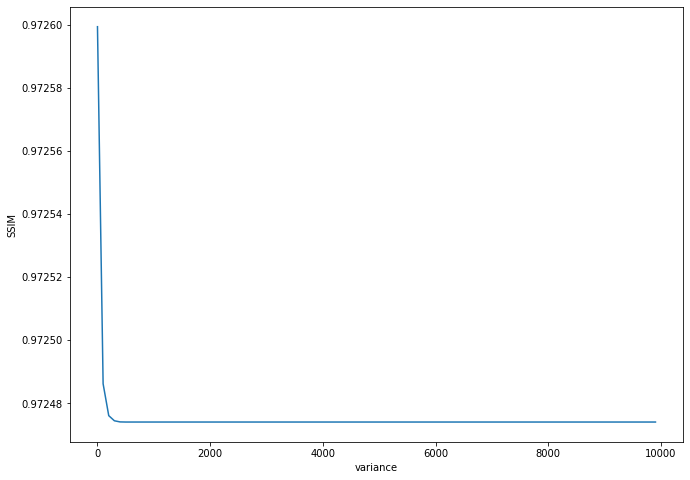

In [112]:
# Plot var vs SSIM
plt.plot(var_arr, ssim_arr)
plt.xlabel('variance')
plt.ylabel('SSIM')

- Trends similar to that of hard thresholding can be observed here
- The SSIM values here are smaller than hard thresholding because of normalizing factors k1 and k2

## d. The method of Chen et al. [2]

### On grayscale images

In [113]:
# Define the arrays
psnr_arr = []
ssim_arr = []
var_arr = []
for var in range(1, 100):
  blurred_img = NeighShrink(img1_gray, var) # Apply neigh shrink on image
  psnr_arr.append(psnr(img1_gray, blurred_img)) # Compute PSNR
  ssim_arr.append(SSIM_score(img1_gray, blurred_img)) # Compute SSIM
  var_arr.append(var)
  
  
psnr_arr = np.array(psnr_arr)
ssim_arr = np.array(ssim_arr)
var_arr = np.array(var_arr)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: divide by zero encountered in double_scalars
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: RuntimeWarning: divide by zero encountered in double_scalars
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: RuntimeWarning: divide by zero encountered in double_scalars


Text(0, 0.5, 'PSNR')

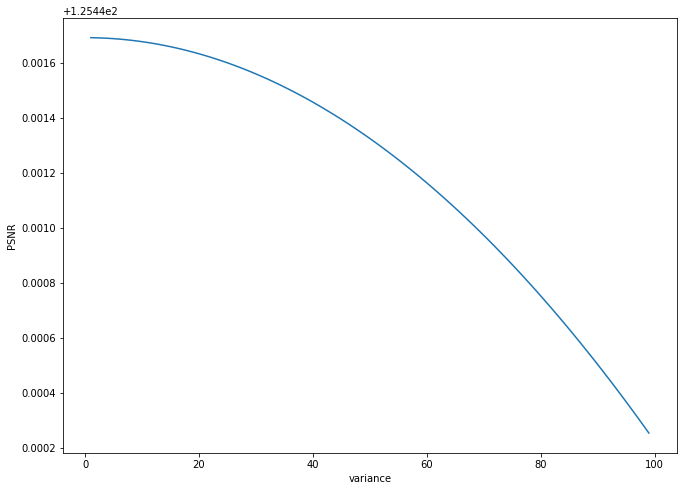

In [114]:
# Plot var vs PSNR
plt.plot(var_arr, psnr_arr)
plt.xlabel('variance')
plt.ylabel('PSNR')

Text(0, 0.5, 'SSIM')

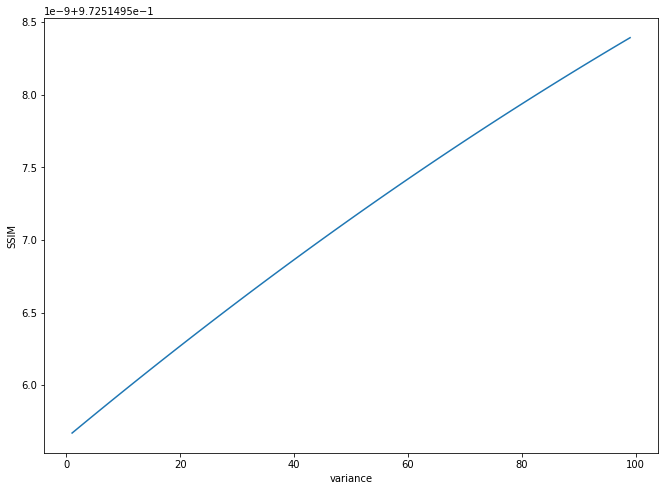

In [115]:
# Plot var vs SSIM
plt.plot(var_arr, ssim_arr)
plt.xlabel('variance')
plt.ylabel('SSIM')

### On color RGB images

In [116]:
b, g, r = cv2.split(img1) # Split the RGB channels

# Define the arrays
psnr_arr = []
ssim_arr = []
var_arr = []
for var in range(2, 100):
  # Apply neigh shrink on RGB channels independently
  blurred_img_b = NeighShrink(b, var)
  blurred_img_g = NeighShrink(g, var)
  blurred_img_r = NeighShrink(r, var)
  blurred_img = cv2.merge([blurred_img_b, blurred_img_g, blurred_img_r]) # Merge the channels
  psnr_arr.append(psnr(img1, blurred_img)) # Compute PSNR
  ssim_arr.append(SSIM_score(img1, blurred_img)) # Compute SSIM
  var_arr.append(var)
  
  
psnr_arr = np.array(psnr_arr)
ssim_arr = np.array(ssim_arr)
var_arr = np.array(var_arr)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: divide by zero encountered in double_scalars
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: RuntimeWarning: divide by zero encountered in double_scalars
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: RuntimeWarning: divide by zero encountered in double_scalars


Text(0, 0.5, 'PSNR')

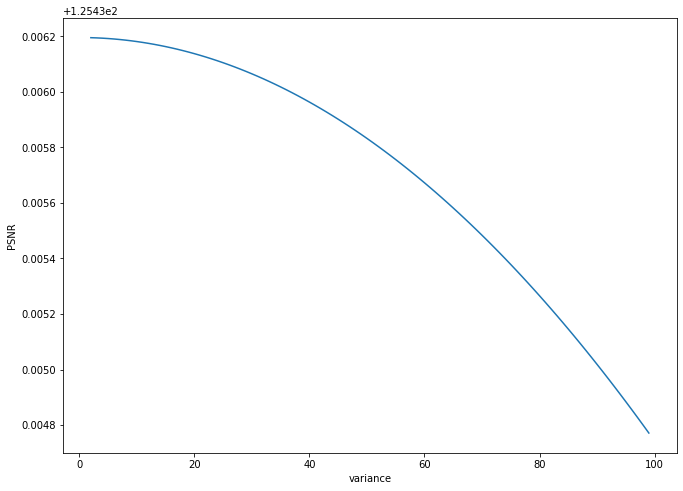

In [117]:
# Plot var vs PSNR
plt.plot(var_arr, psnr_arr)
plt.xlabel('variance')
plt.ylabel('PSNR')

Text(0, 0.5, 'SSIM')

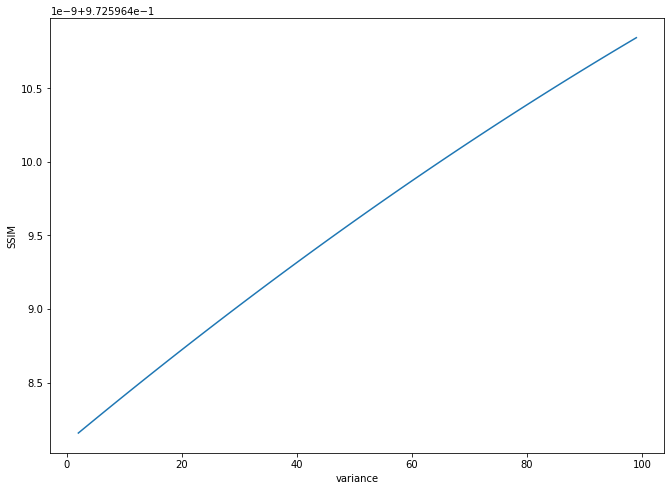

In [118]:
# Plot var vs SSIM
plt.plot(var_arr, ssim_arr)
plt.xlabel('variance')
plt.ylabel('SSIM')

## e. When the method is independently applied to RGB channels, versus when the method is applied to I channel of HSI transform. [2]

### The method applied to RGB channels

In [119]:
b, g, r = cv2.split(img1) # Spli the RGB channels

# Define the arrays
psnr_arr = []
ssim_arr = []
var_arr = []
for var in range(2, 100):
  # Apply neigh shrink on RGB channels independently
  blurred_img_b = NeighShrink(b, var)
  blurred_img_g = NeighShrink(g, var)
  blurred_img_r = NeighShrink(r, var)
  blurred_img = cv2.merge([blurred_img_b, blurred_img_g, blurred_img_r]) # Merge the channels
  psnr_arr.append(psnr(img1, blurred_img)) # Compute PSNR
  ssim_arr.append(SSIM_score(img1, blurred_img)) # Compute SSIM
  var_arr.append(var)
  
  
psnr_arr = np.array(psnr_arr)
ssim_arr = np.array(ssim_arr)
var_arr = np.array(var_arr)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: divide by zero encountered in double_scalars
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: RuntimeWarning: divide by zero encountered in double_scalars
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: RuntimeWarning: divide by zero encountered in double_scalars


Text(0, 0.5, 'PSNR')

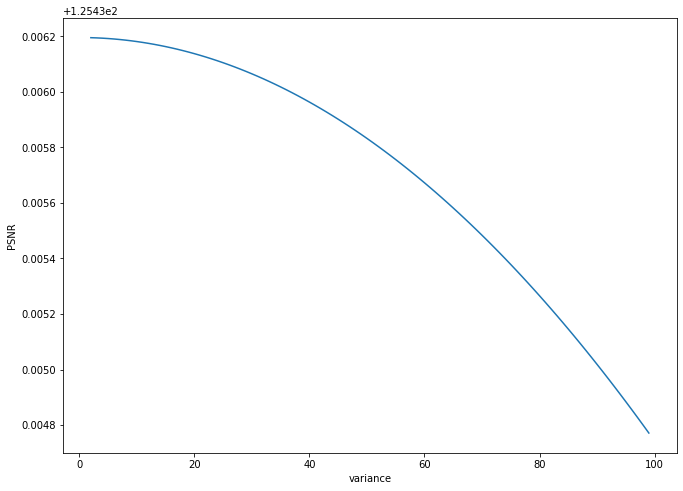

In [120]:
# Plot var vs PSNR
plt.plot(var_arr, psnr_arr)
plt.xlabel('variance')
plt.ylabel('PSNR')

Text(0, 0.5, 'SSIM')

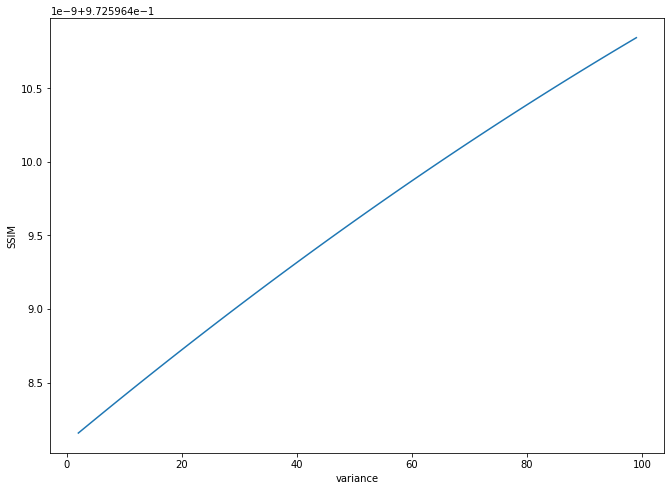

In [121]:
# Plot var vs SSIM
plt.plot(var_arr, ssim_arr)
plt.xlabel('variance')
plt.ylabel('SSIM')

### The method applied to I channel of HSI transform

In [122]:
b, g, r = cv2.split(img1) # Split RGB channels
I = (b+g+r)/3 # Compute Intensity from RGB
print(I.shape) # Check the shape

(720, 720)


In [123]:
# Define the arrays
psnr_arr = []
ssim_arr = []
var_arr = []
for var in range(1, 100):
  blurred_img = NeighShrink(I, var) # Apply neighshrink
  psnr_arr.append(psnr(I, blurred_img)) # Compute PSNR
  ssim_arr.append(SSIM_score(I, blurred_img)) # Compute SSIM
  var_arr.append(var)
  
  
psnr_arr = np.array(psnr_arr)
ssim_arr = np.array(ssim_arr)
var_arr = np.array(var_arr)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: divide by zero encountered in double_scalars
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: RuntimeWarning: divide by zero encountered in double_scalars
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: RuntimeWarning: divide by zero encountered in double_scalars


Text(0, 0.5, 'PSNR')

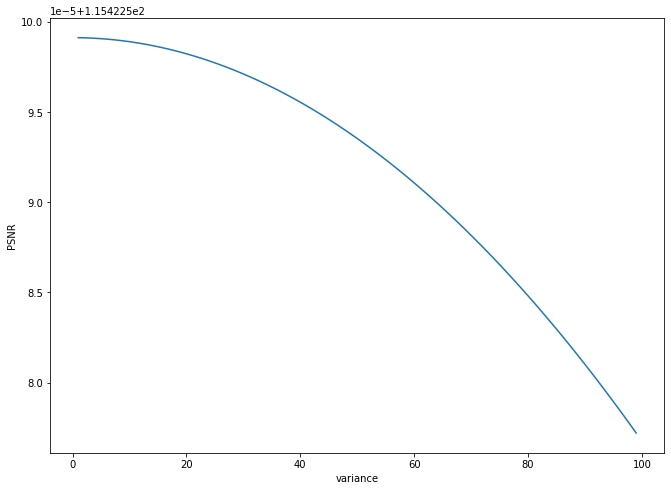

In [124]:
# Plot var vs PSNR
plt.plot(var_arr, psnr_arr)
plt.xlabel('variance')
plt.ylabel('PSNR')

Text(0, 0.5, 'SSIM')

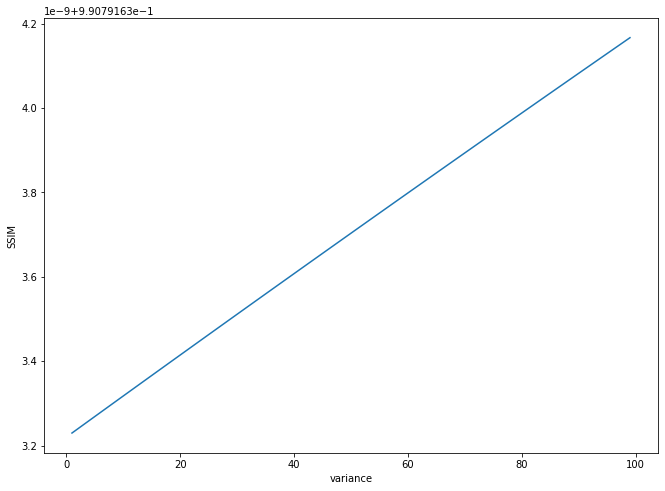

In [125]:
# Plot var vs SSIM
plt.plot(var_arr, ssim_arr)
plt.xlabel('variance')
plt.ylabel('SSIM')

# 4. Compare a few of the methods from part 3 on real noisy images, where noise variance is not known, by assuming various values of the noise variance as trial and error. [2]

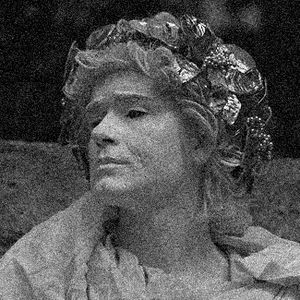

In [126]:
# Import a real noisy image
noisy = cv2.imread('noisy.jpg', 0)
cv2_imshow(noisy)

## Gaussian low pass filtering

- The image on the left is the original Image
- The image on the right is the image after blurring with the given parameters

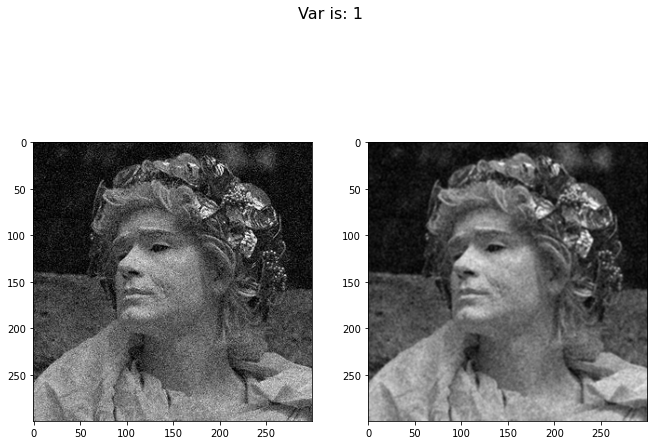

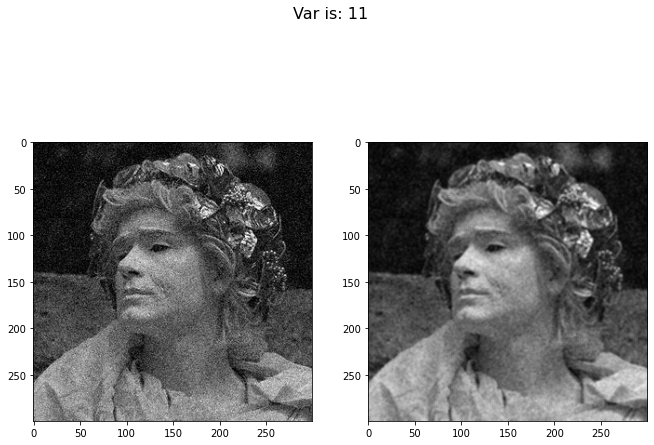

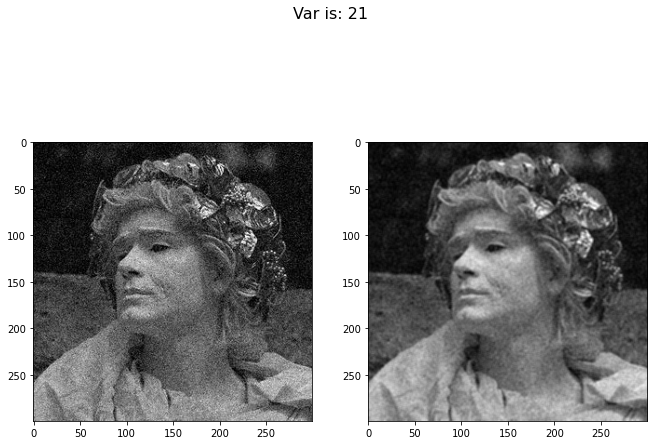

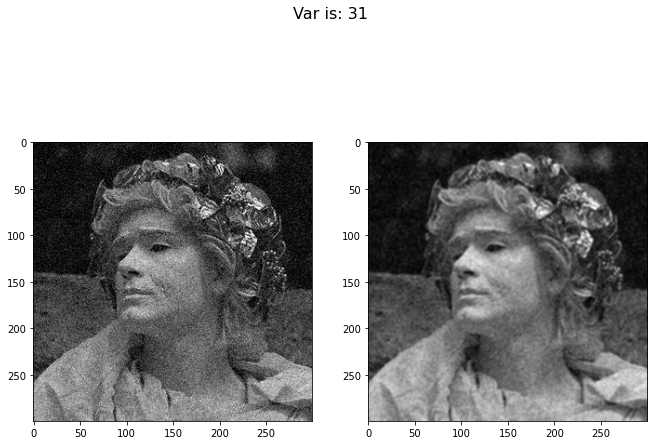

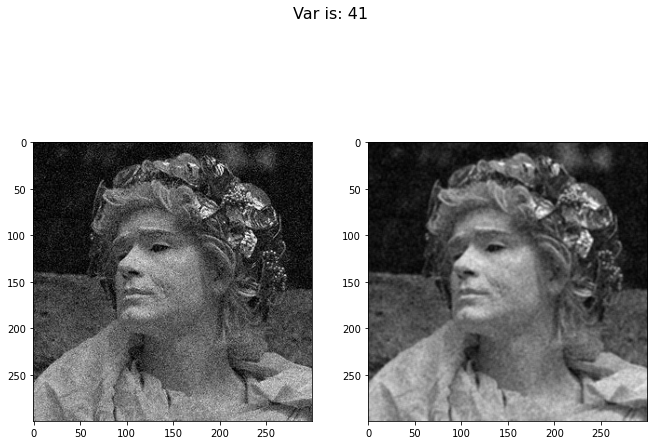

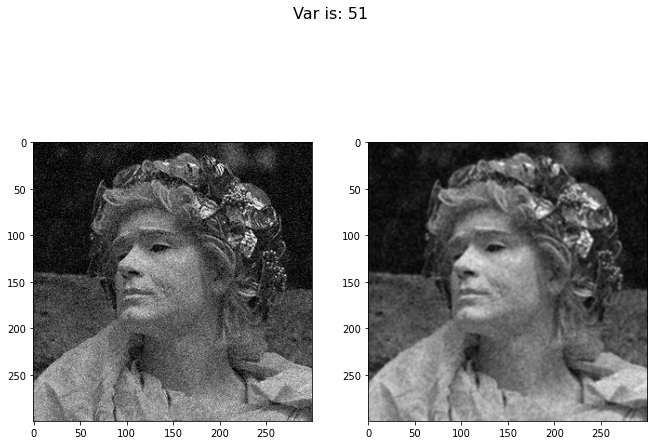

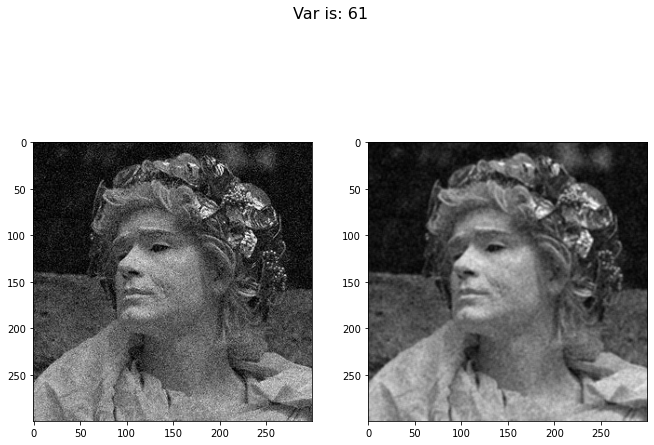

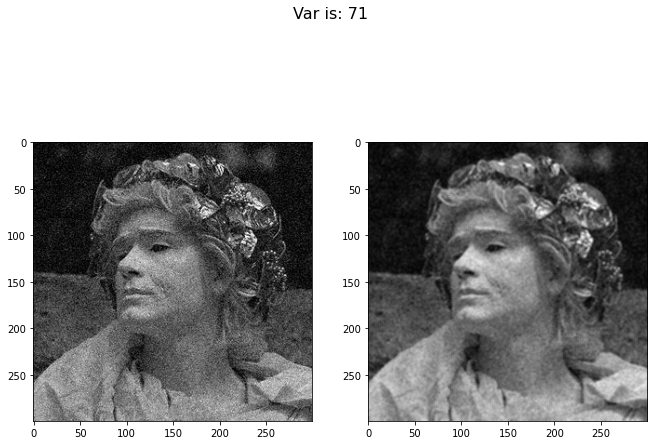

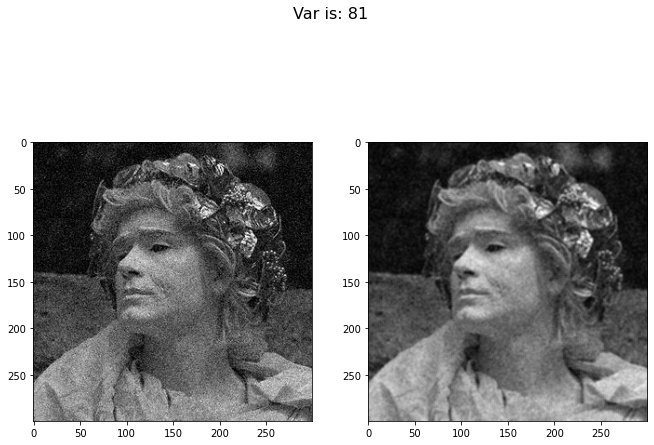

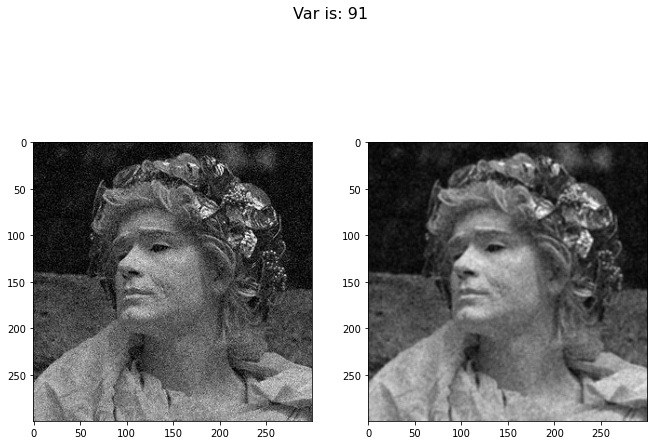

In [127]:
for var in range(1, 100, 10):
  res = isotropic_gaussian_blurring(noisy, 3, math.sqrt(var)) # Try removing noise using isotropic gaussian low pass filter
  show_side_by_side(noisy, res, var)

## Hard thresholding

- The image on the left is the original Image
- The image on the right is the image after blurring with the given parameters

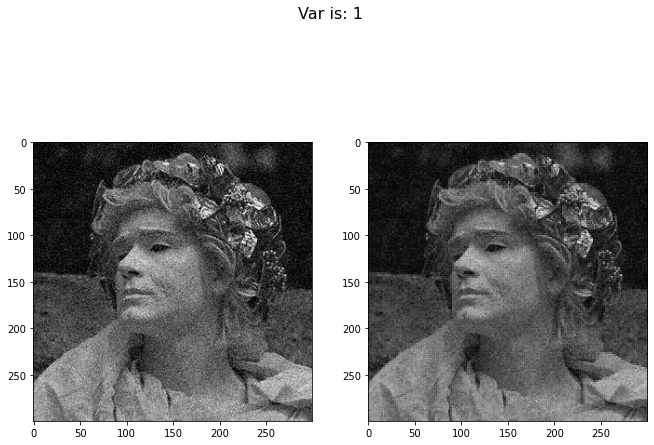

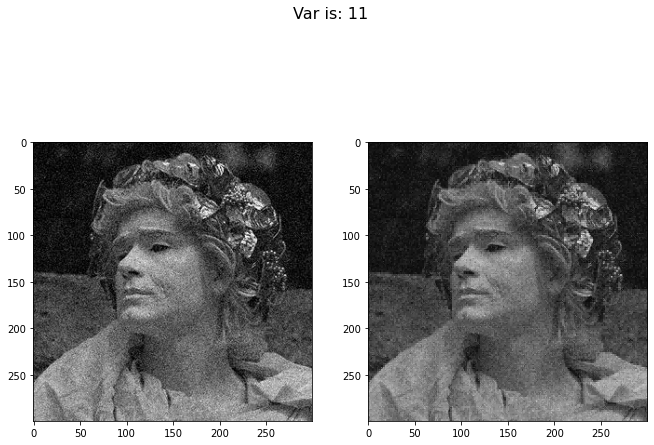

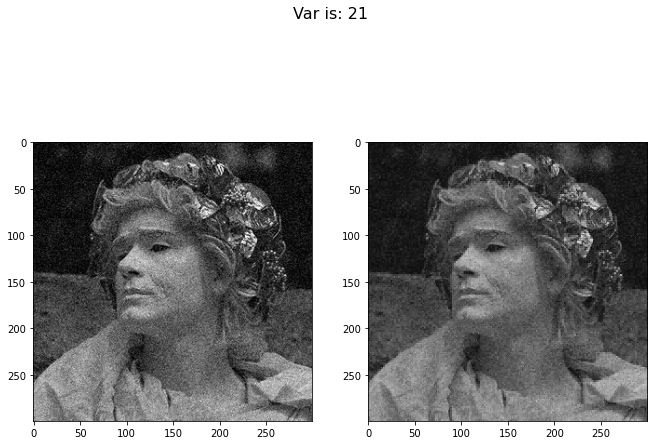

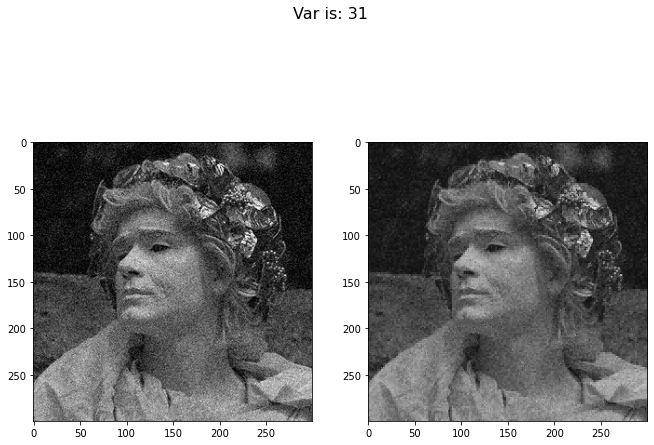

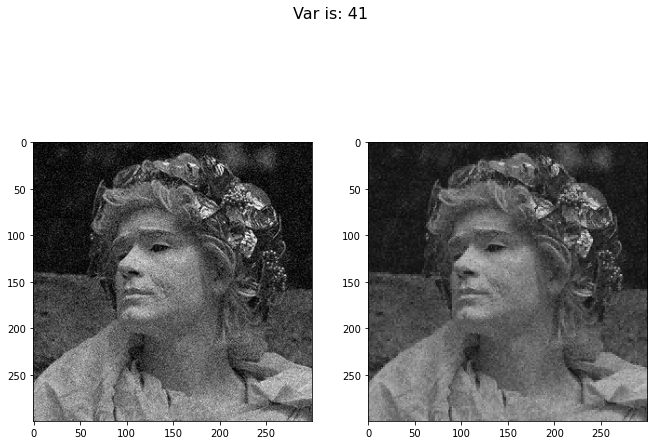

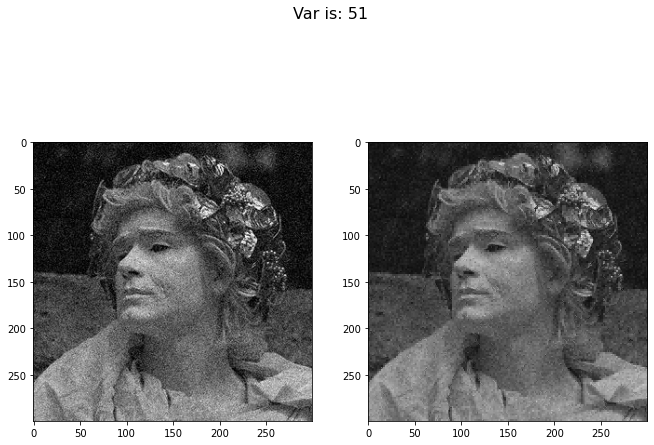

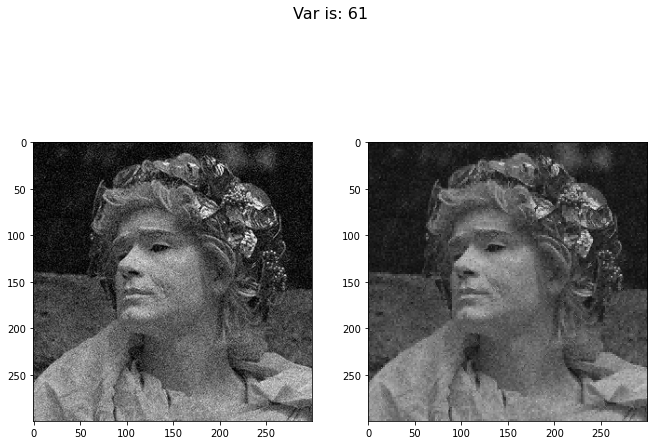

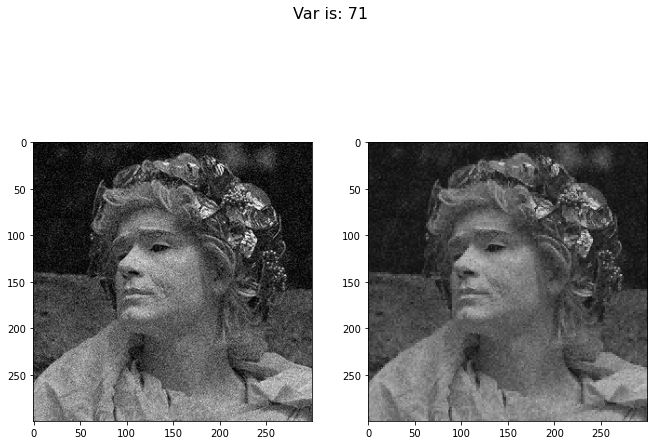

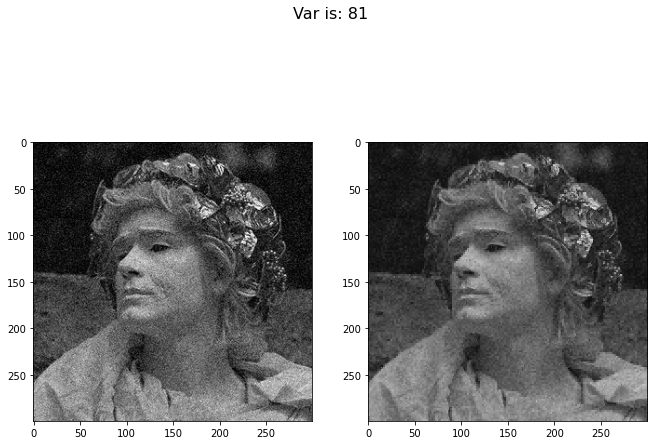

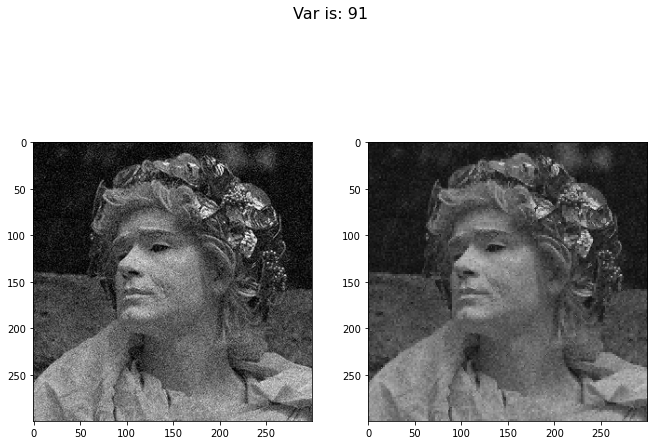

In [128]:
# Try hard thresholding
for var in range(1, 100, 10):
  threshold = 2*math.sqrt(var)*math.sqrt(math.log(noisy.shape[0]))
  res = hard_threshold(noisy, threshold)
  show_side_by_side(noisy, res, var)

## Soft thresholding

- The image on the left is the original Image
- The image on the right is the image after blurring with the given parameters

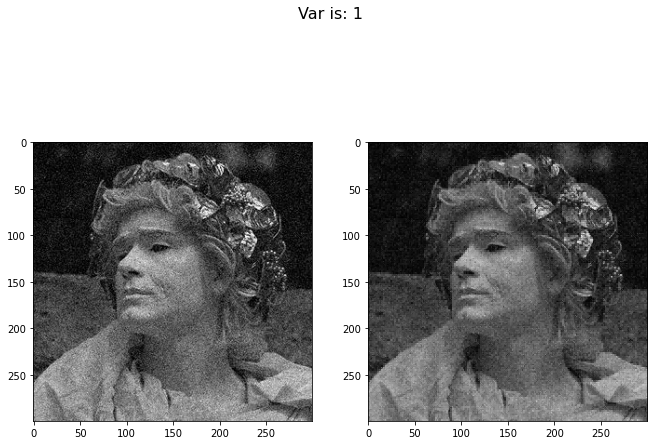

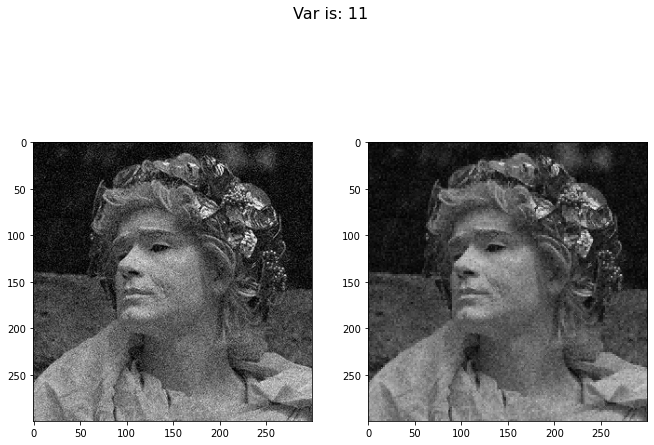

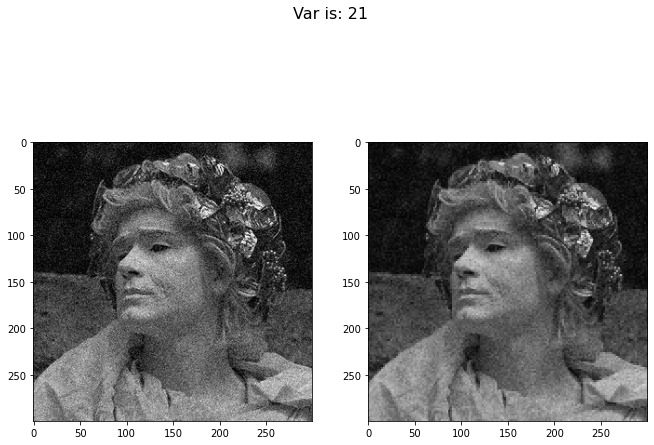

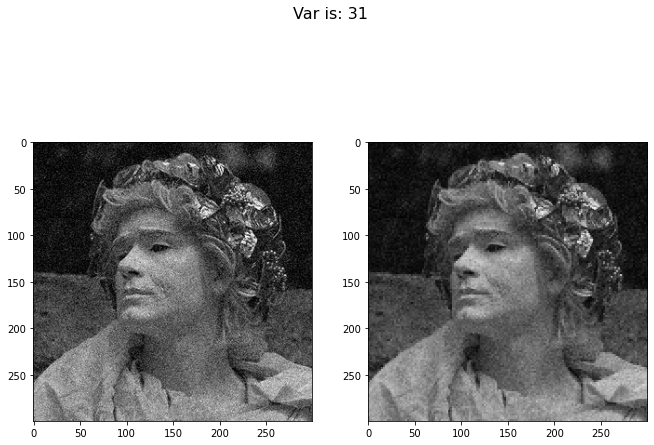

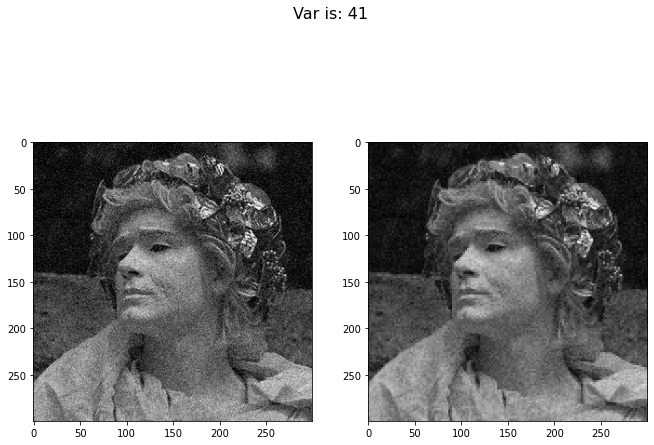

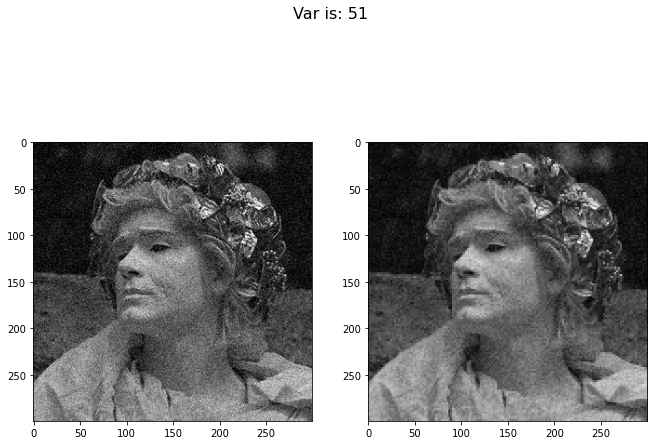

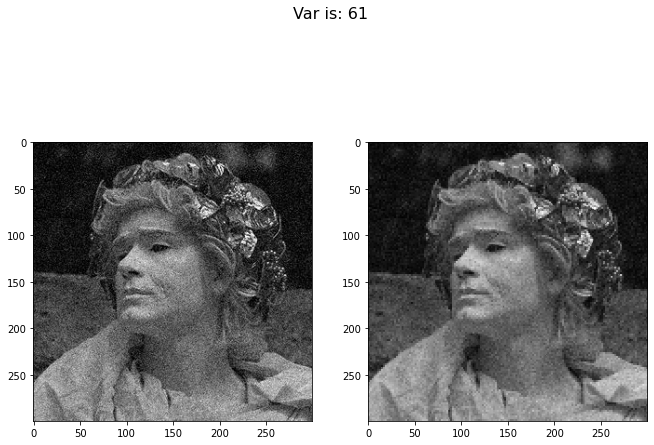

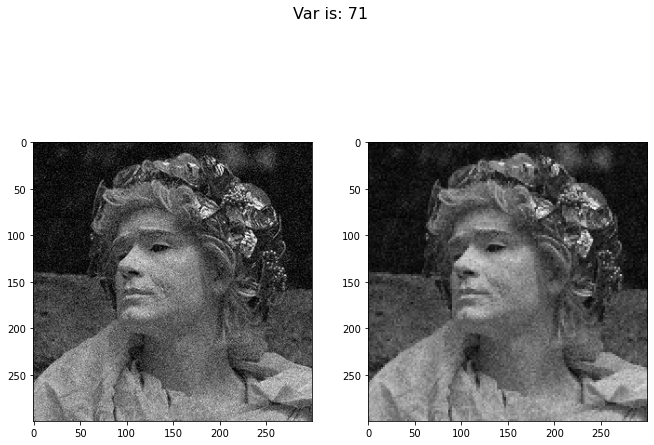

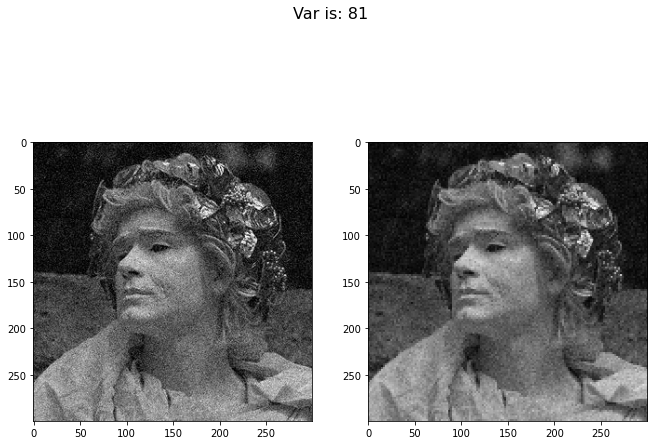

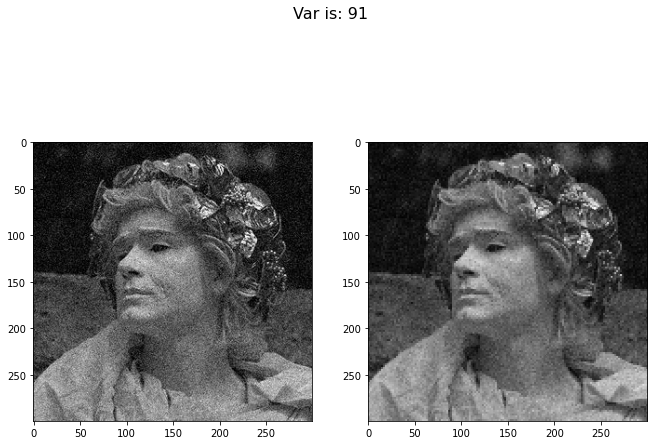

In [129]:
# Try soft thresholding
for var in range(1, 100, 10):
  threshold = 2*math.sqrt(var)*math.sqrt(math.log(noisy.shape[0]))
  res = soft_threshold(noisy, threshold)
  show_side_by_side(noisy, res, var)

## The method of Chen et al.

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: divide by zero encountered in double_scalars
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: RuntimeWarning: divide by zero encountered in double_scalars
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: RuntimeWarning: divide by zero encountered in double_scalars


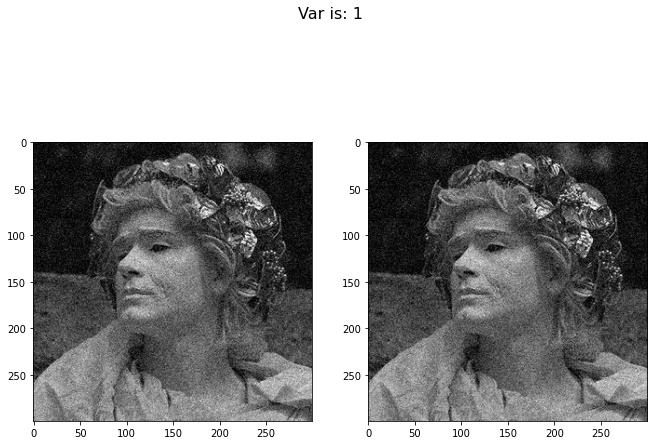

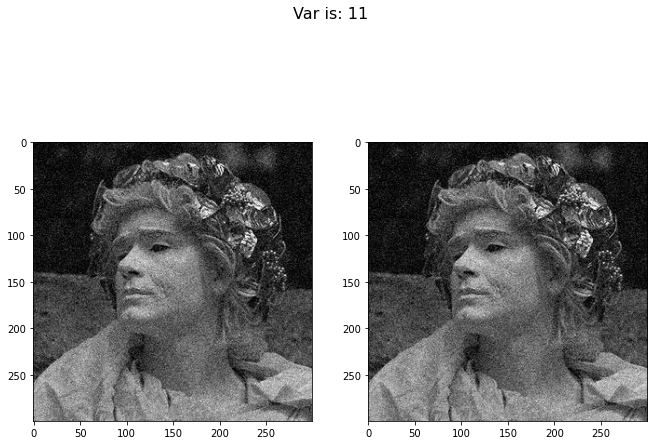

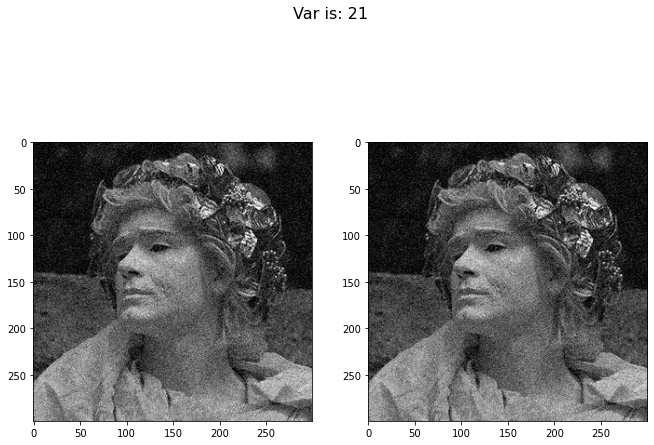

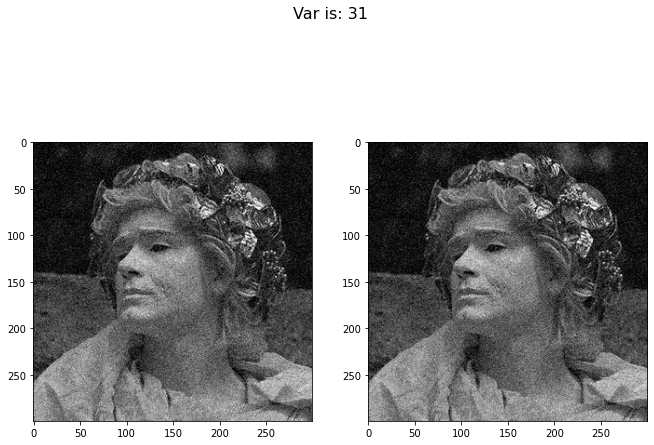

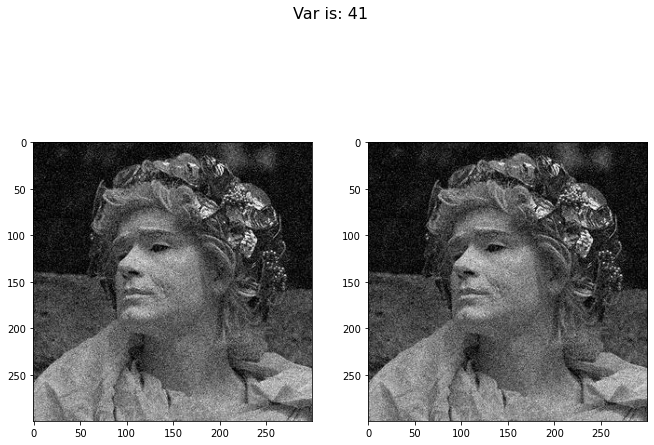

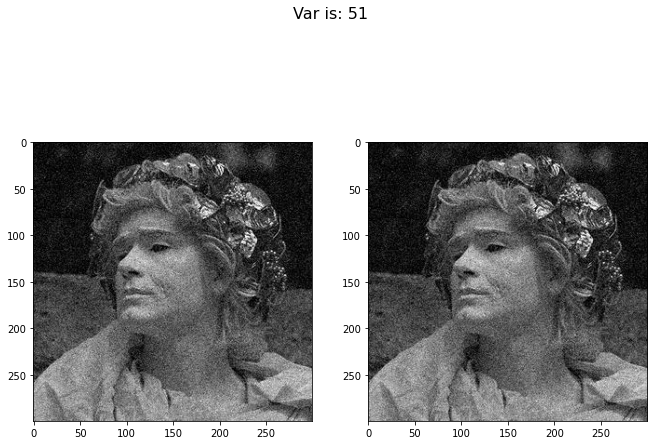

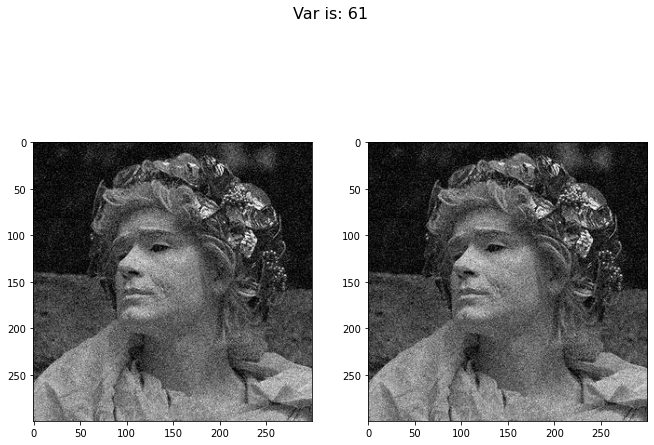

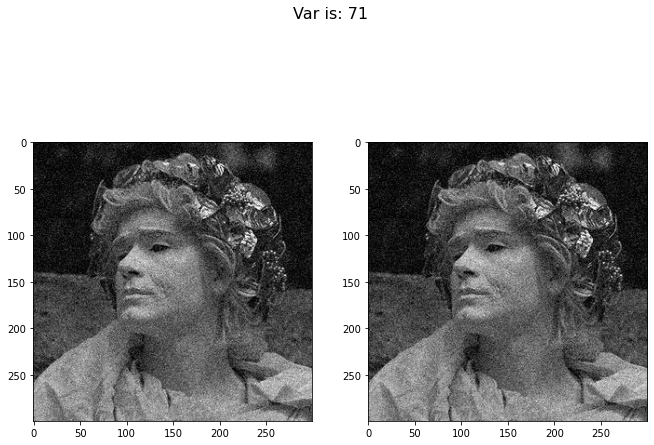

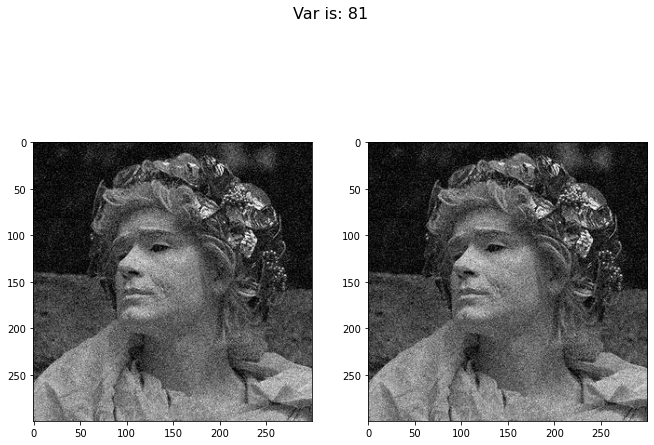

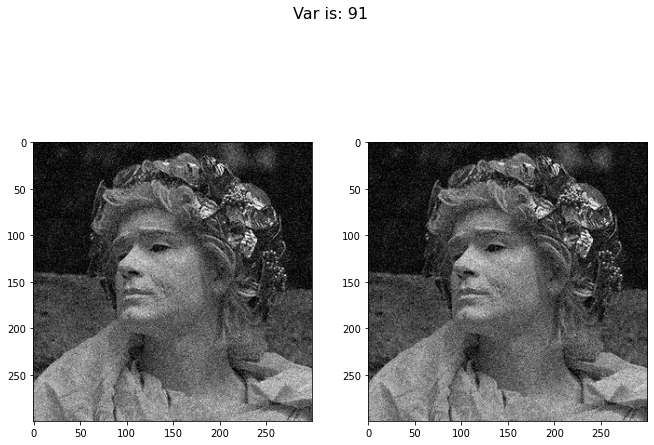

In [130]:
# Try the method of Chen given in the paper
# https://www.egr.msu.edu/~aviyente/neighshrink.pdf
for var in range(1, 100, 10):
  res = NeighShrink(noisy, var)
  show_side_by_side(noisy, res, var)

# 5. Optional, for fun only: Repeat Wiener filtering of assignment 2 on ImgBlur.png with a filter that is defined by np.ones((2,11)), and check if you can now read the number

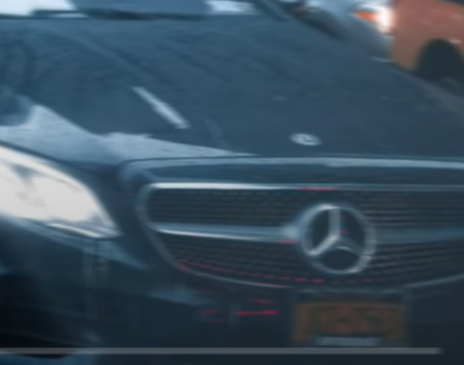

In [131]:
number_plate_img = cv2.imread('imgBlur.png')
cv2_imshow(number_plate_img)

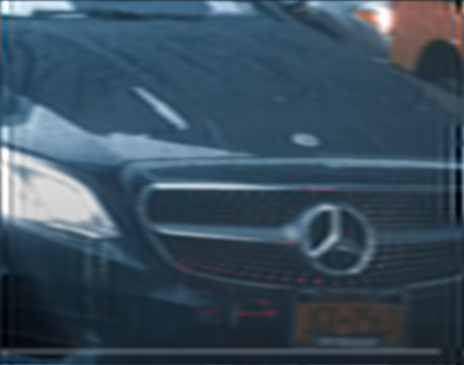

In [132]:
from skimage import restoration

psf = np.ones((2,11))
psf /= np.sum(psf)

b, g, r = cv2.split(number_plate_img)

b = restoration.wiener(b, psf, 1, clip = False)
g = restoration.wiener(g, psf, 1, clip = False)
r = restoration.wiener(r, psf, 1, clip = False)
rgb = np.dstack((b,g,r))

cv2_imshow(rgb)

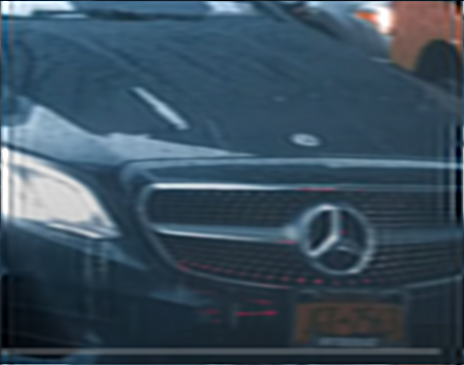

In [133]:
# Sharpen image to enhance details
kernel = np.array([[0,-1,0], [-1,5,-1], [0,-1,0]])
final5 = cv2.filter2D(rgb, -1, kernel)
cv2_imshow(final5)

# Reference

- https://dsp.stackexchange.com/questions/75187/how-to-apply-the-ssim-measure-on-rgb-images
- https://stackoverflow.com/questions/17190649/how-to-obtain-a-gaussian-filter-in-python
- https://pywavelets.readthedocs.io/en/latest/
- https://pywavelets.readthedocs.io/en/latest/ref/idwt-inverse-discrete-wavelet-transform.html
- https://pywavelets.readthedocs.io/en/latest/ref/2d-dwt-and-idwt.html
- https://www.egr.msu.edu/~aviyente/neighshrink.pdf